In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Kamini/img_aug_370_hflip.jpg
/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Kamini/img_aug_45_zoom.jpg
/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Kamini/img_aug_407_vflip.jpg
/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Kamini/img_aug_367_vflip.jpg
/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Kamini/img_aug_3_vflip.jpg
/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Kamini/img_origonly_535_orig.jpg
/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Kamini/img_aug_245_hflip.jpg
/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Kamini/img_aug_319_zoom.jpg
/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Kamini/img_aug_310_zoom.jpg
/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Kamini/img_aug_80_hflip.jpg
/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Kamini/im

In [2]:
# ----------------------------
# Basic Libraries
# ----------------------------
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split
from collections import Counter
import warnings
warnings.filterwarnings("ignore")

# ----------------------------
# TensorFlow / Keras Imports
# ----------------------------
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential, regularizers
from tensorflow.keras.layers import *
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.initializers import he_normal
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.applications import ResNet50, Xception
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.callbacks import EarlyStopping


2025-05-28 19:39:50.891060: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748461191.347242      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748461191.464598      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [34]:
# Directory containing the "Train" folder
directory = "/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh"

filepath =[]
label = []

folds = os.listdir(directory)

for fold in folds:
    f_path = os.path.join(directory , fold)
    
    imgs = os.listdir(f_path)
    
    for img in imgs:
        
        img_path = os.path.join(f_path , img)
        filepath.append(img_path)
        label.append(fold)
        
#Concat data paths with labels
file_path_series = pd.Series(filepath , name= 'filepath')
Label_path_series = pd.Series(label , name = 'label')
df_train = pd.concat([file_path_series ,Label_path_series ] , axis = 1)

In [35]:
# Head 
df_train

,filepath,label
0,/kaggle/input/10-flowers-of-bangladesh/10 Flow...,Kamini
1,/kaggle/input/10-flowers-of-bangladesh/10 Flow...,Kamini
2,/kaggle/input/10-flowers-of-bangladesh/10 Flow...,Kamini
3,/kaggle/input/10-flowers-of-bangladesh/10 Flow...,Kamini
4,/kaggle/input/10-flowers-of-bangladesh/10 Flow...,Kamini
...,...,...
19995,/kaggle/input/10-flowers-of-bangladesh/10 Flow...,Belly
19996,/kaggle/input/10-flowers-of-bangladesh/10 Flow...,Belly
19997,/kaggle/input/10-flowers-of-bangladesh/10 Flow...,Belly
19998,/kaggle/input/10-flowers-of-bangladesh/10 Flow...,Belly


In [37]:

train_df , dummy_df = train_test_split(df_train ,train_size = 0.8 , shuffle = True ,random_state = 42 )
# Spliting in Validation and Test From Dummy 
valid_df , test_df = train_test_split(dummy_df ,test_size= 0.5 , shuffle = True ,random_state = 42)

In [6]:
# Shape
print(f"The shape of The Train data is: {train_df.shape}")
print(f"The shape of The Validation data is: {valid_df.shape}")
print(f"The shape of The Test data is: {test_df.shape}")

The shape of The Train data is: (16000, 2)
The shape of The Validation data is: (2000, 2)
The shape of The Test data is: (2000, 2)


In [30]:
# Create ImageDataGenerator instances for  Train , validation and test sets (only rescale pixel values)
train_datagen = ImageDataGenerator(rescale=1./255,)
validation_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Define batch size
batch_size = 32

# Flow images from dataframes and apply augmentation (if any)
print("Training Data")
train_ds = train_datagen.flow_from_dataframe(
    train_df,
    x_col='filepath',    
    y_col='label',        
    target_size=(224, 224), 
    batch_size=batch_size,
    class_mode='categorical' 
)

print("Validation Data")
train_ds = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='filepath',
    y_col='label',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True   # Important
)

test_ds = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='filepath',
    y_col='label',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False  # Must remain False
)


Training Data
Found 16000 validated image filenames belonging to 10 classes.
Validation Data
Found 16000 validated image filenames belonging to 10 classes.
Found 2000 validated image filenames belonging to 10 classes.


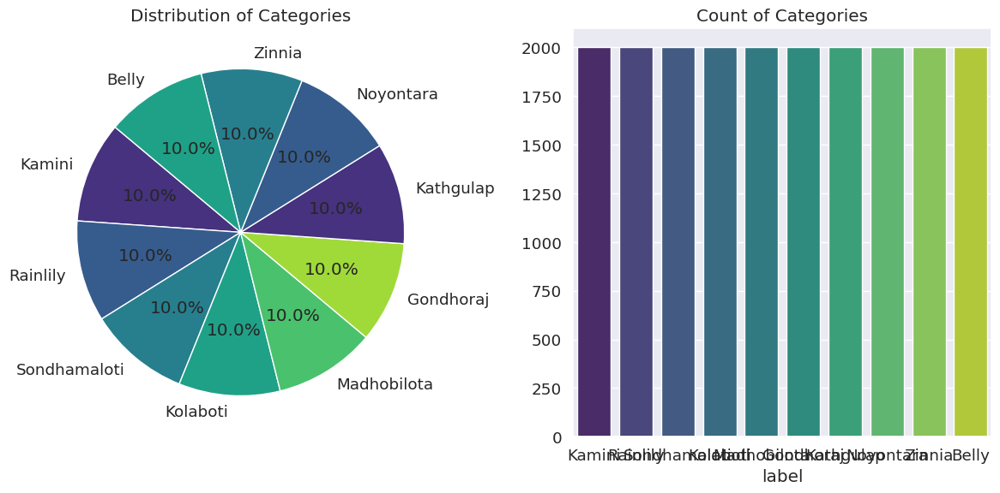

In [40]:
# Count the occurrences of each category in the 'category' column
count = df_train['label'].value_counts()

# Create a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 6), facecolor='white')

# Plot pie chart on the first subplot
palette = sns.color_palette("viridis")
sns.set_palette(palette)
axs[0].pie(count, labels=count.index, autopct='%1.1f%%', startangle=140)
axs[0].set_title('Distribution of Categories')

# Plot bar chart on the second subplot
sns.barplot(x=count.index, y=count.values, ax=axs[1], palette="viridis")
axs[1].set_title('Count of Categories')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [41]:
def visualize_images(path, num_images=5):
    # Get a list of image filenames in the specified path
    image_filenames = os.listdir(path)
    
    # Limit the number of images to visualize if there are more than num_images
    num_images = min(num_images, len(image_filenames))
    
    # Create a figure and axis object to display images
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3),facecolor='white')
    
    # Iterate over the selected images and display them
    for i, image_filename in enumerate(image_filenames[:num_images]):
        # Load the image using Matplotlib
        image_path = os.path.join(path, image_filename)
        image = mpimg.imread(image_path)
        
        # Display the image
        axes[i].imshow(image)
        axes[i].axis('off')  # Turn off axis
        axes[i].set_title(image_filename)  # Set image filename as title
    
    # Adjust layout and display the figure
    plt.tight_layout()
    plt.show()

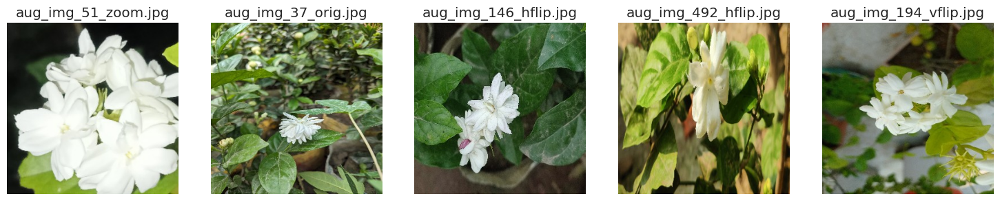

In [42]:
# Specify the path containing the images to visualize
path_to_visualize = "/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Belly"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

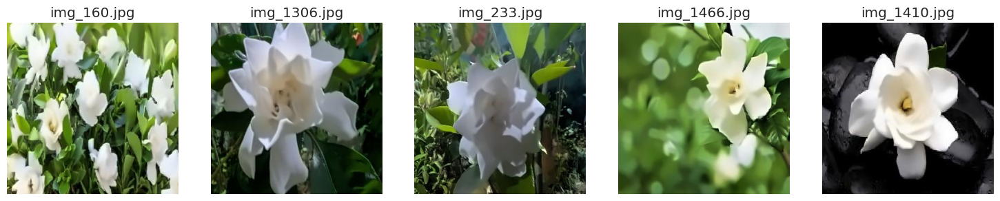

In [43]:
# Specify the path containing the images to visualize
path_to_visualize = "/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Gondhoraj"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

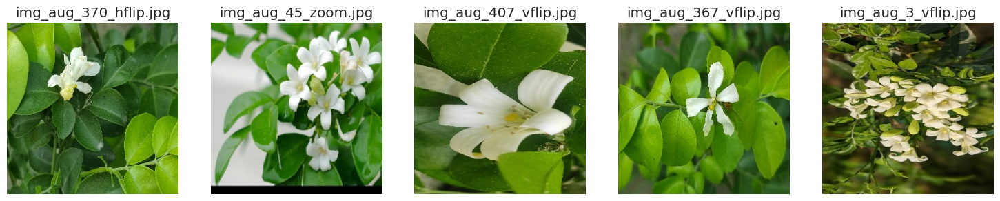

In [44]:
# Specify the path containing the images to visualize
path_to_visualize = "/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Kamini"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

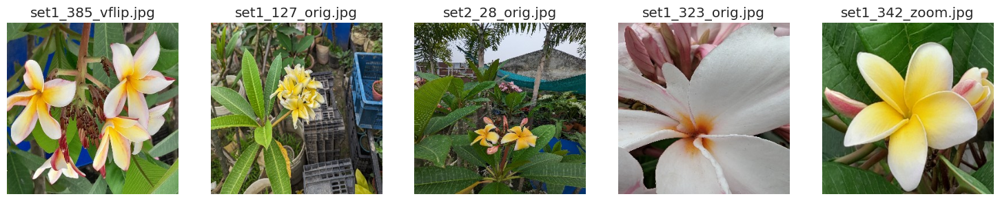

In [45]:
# Specify the path containing the images to visualize
path_to_visualize = "/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Kathgulap"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

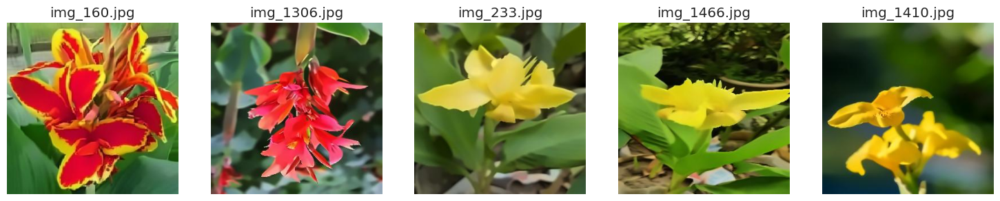

In [46]:
# Specify the path containing the images to visualize
path_to_visualize = "/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Kolaboti"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

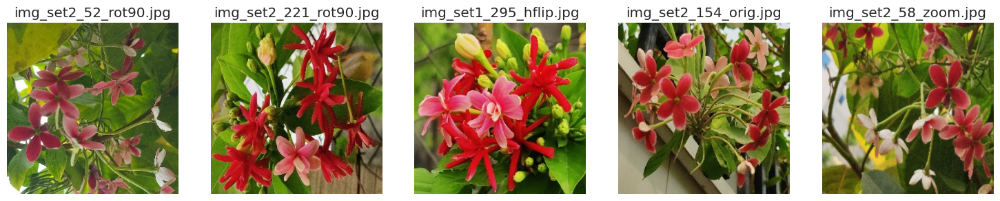

In [47]:
# Specify the path containing the images to visualize
path_to_visualize = "/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Madhobilota"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

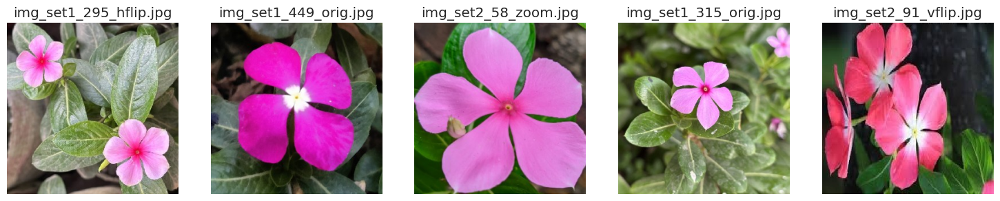

In [48]:
# Specify the path containing the images to visualize
path_to_visualize = "/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Noyontara"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

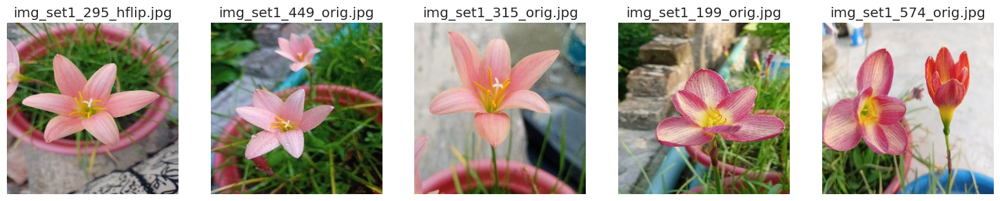

In [49]:
# Specify the path containing the images to visualize
path_to_visualize = "/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Rainlily"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

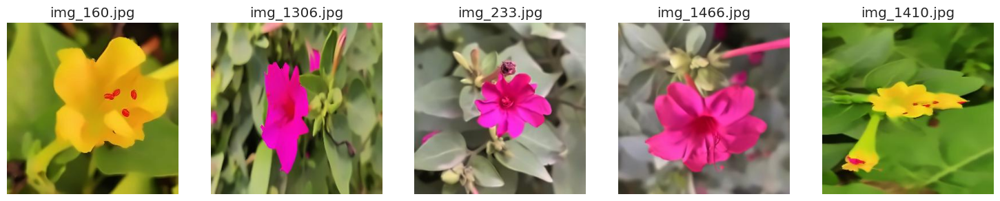

In [50]:
# Specify the path containing the images to visualize
path_to_visualize = "/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Sondhamaloti"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

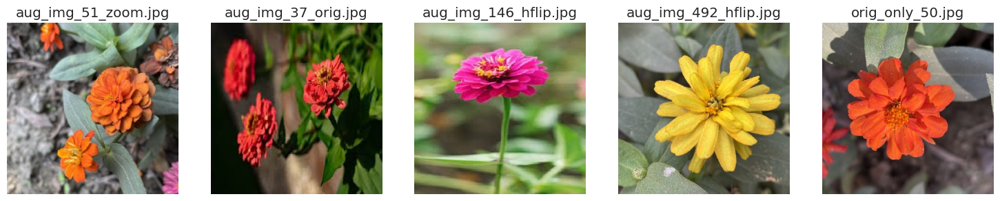

In [51]:
# Specify the path containing the images to visualize
path_to_visualize = "/kaggle/input/10-flowers-of-bangladesh/10 Flowers of Bangladesh/Zinnia"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

In [52]:
# Get the class indices assigned by the generators
class_indices_train = train_ds.class_indices

# Print the class indices
print("Class indices for Training Data:", class_indices_train)

Class indices for Training Data: {'Belly': 0, 'Gondhoraj': 1, 'Kamini': 2, 'Kathgulap': 3, 'Kolaboti': 4, 'Madhobilota': 5, 'Noyontara': 6, 'Rainlily': 7, 'Sondhamaloti': 8, 'Zinnia': 9}


In [53]:
# Load the DenseNet121 base model without the top (classification) layer
from tensorflow.keras.applications import DenseNet121
base_model = DenseNet121(weights='imagenet', include_top=False, pooling='max', input_shape=(224, 224, 3))

# Freeze the layers in the base model
base_model.trainable = False

# Build Model 
model = Sequential()

# Base Model 
model.add(base_model)

# Batch Normalization
model.add(BatchNormalization())

# Dense Layer 1
model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.01),
               ))

# Batch Normalization
model.add(BatchNormalization())

# Dropout Layer
model.add(Dropout(0.5)) 

# Output Layer
model.add(Dense(10, activation='softmax'))

# Compile
model.compile(optimizer=Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ densenet121 (Functional)             │ (None, 1024)                │       7,037,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 1024)                │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │         262,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 10)                  │           2,570 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,307,594 (27.88 MB)

 Trainable params: 267,530 (1.02 MB)

 Non-trainable params: 7,040,064 (26.86 MB)

In [54]:
#Early_Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

#Fitting Model
history = model.fit(train_ds,
                        epochs= 10,
#                         steps_per_epoch = len(train_ds),
                        validation_data = validation_ds,
#                         validation_steps = len(validation_ds),
                        callbacks = early_stopping)

Epoch 1/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 95s 136ms/step - accuracy: 0.7528 - loss: 3.7998 - val_accuracy: 0.9790 - val_loss: 1.9255
Epoch 2/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - accuracy: 0.9566 - loss: 1.7727 - val_accuracy: 0.9885 - val_loss: 1.1945
Epoch 3/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - accuracy: 0.9763 - loss: 1.1100 - val_accuracy: 0.9960 - val_loss: 0.7723
Epoch 4/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - accuracy: 0.9838 - loss: 0.7326 - val_accuracy: 0.9940 - val_loss: 0.5307
Epoch 5/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - accuracy: 0.9911 - loss: 0.5003 - val_accuracy: 0.9950 - val_loss: 0.3813
Epoch 6/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - accuracy: 0.9920 - loss: 0.3596 - val_accuracy: 0.9960 - val_loss: 0.2832
Epoch 7/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - accuracy: 0.9928 - loss: 0.2716 - val_accuracy: 0.9975 - val_loss: 0.2192
Epoch 8/10
500/500 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - accuracy: 0.9933 - loss: 0.2

In [55]:
# Evaluate the model on the validation dataset
validation_loss, validation_accuracy = model.evaluate(validation_ds)

# Print the validation loss and accuracy
print("Validation Loss:", validation_loss)
print("Validation Accuracy:", validation_accuracy)

63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - accuracy: 0.9954 - loss: 0.1365
Validation Loss: 0.12955749034881592
Validation Accuracy: 0.996999979019165


In [56]:
# Evaluate the model on the validation dataset
test_loss, test_accuracy = model.evaluate(test_ds)

# Print the validation loss and accuracy
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 111ms/step - accuracy: 0.9952 - loss: 0.1242
Test Loss: 0.1231306791305542
Test Accuracy: 0.9955000281333923


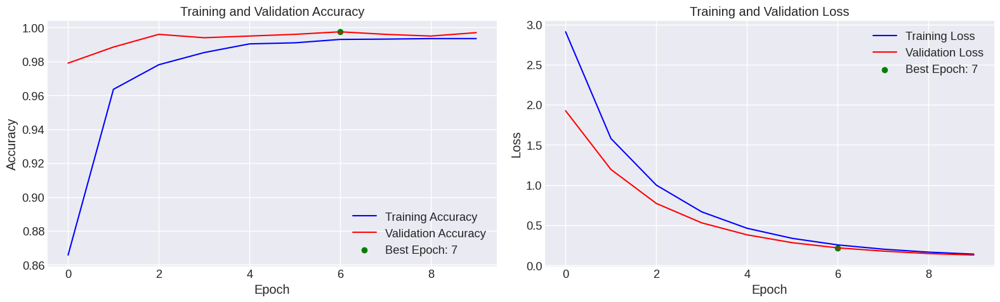

In [57]:
# Get the epoch with the highest validation accuracy
best_epoch = history.history['val_accuracy'].index(max(history.history['val_accuracy'])) + 1

# Set the background style
plt.style.use('seaborn-darkgrid')

# Create a subplot with 1 row and 2 columns
fig, axs = plt.subplots(1, 2, figsize=(16, 5))

# Plot training and validation accuracy
axs[0].plot(history.history['accuracy'], label='Training Accuracy', color='blue')
axs[0].plot(history.history['val_accuracy'], label='Validation Accuracy', color='red')
axs[0].scatter(best_epoch - 1, history.history['val_accuracy'][best_epoch - 1], color='green', label=f'Best Epoch: {best_epoch}')
axs[0].set_xlabel('Epoch')
axs[0].set_ylabel('Accuracy')
axs[0].set_title('Training and Validation Accuracy')
axs[0].legend()

# Plot training and validation loss
axs[1].plot(history.history['loss'], label='Training Loss', color='blue')
axs[1].plot(history.history['val_loss'], label='Validation Loss', color='red')
axs[1].scatter(best_epoch - 1, history.history['val_loss'][best_epoch - 1], color='green',label=f'Best Epoch: {best_epoch}')
axs[1].set_xlabel('Epoch')
axs[1].set_ylabel('Loss')
axs[1].set_title('Training and Validation Loss')
axs[1].legend()

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


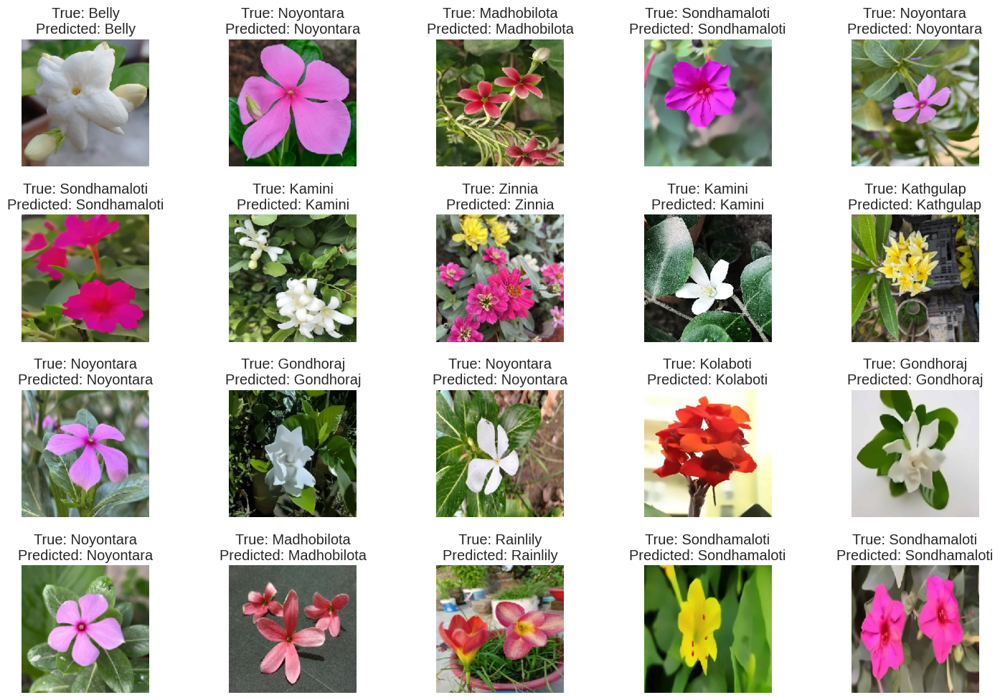

In [58]:
# Get the class labels
class_labels = list(test_ds.class_indices.keys())

# Predict on each image and plot results
num_images = 20
num_images_per_row = 5  # Set the number of images per row
num_rows = 4

plt.figure(figsize=(15, 10))
for i in range(num_images):
    image, label = next(test_ds)
    predictions = model.predict(image)
    
    # Iterate over each image in the batch
    for j in range(len(image)):
        if i * len(image) + j < num_images:  # Check if the total number of images exceeds the desired count
            predicted_class = class_labels[np.argmax(predictions[j])]
            true_class = class_labels[np.argmax(label[j])]
            
            plt.subplot(num_rows, num_images_per_row, i * len(image) + j + 1)
            plt.imshow(image[j])
            plt.title(f'True: {true_class}\nPredicted: {predicted_class}')
            plt.axis('off')

plt.tight_layout()
plt.show()

63/63 ━━━━━━━━━━━━━━━━━━━━ 29s 267ms/step


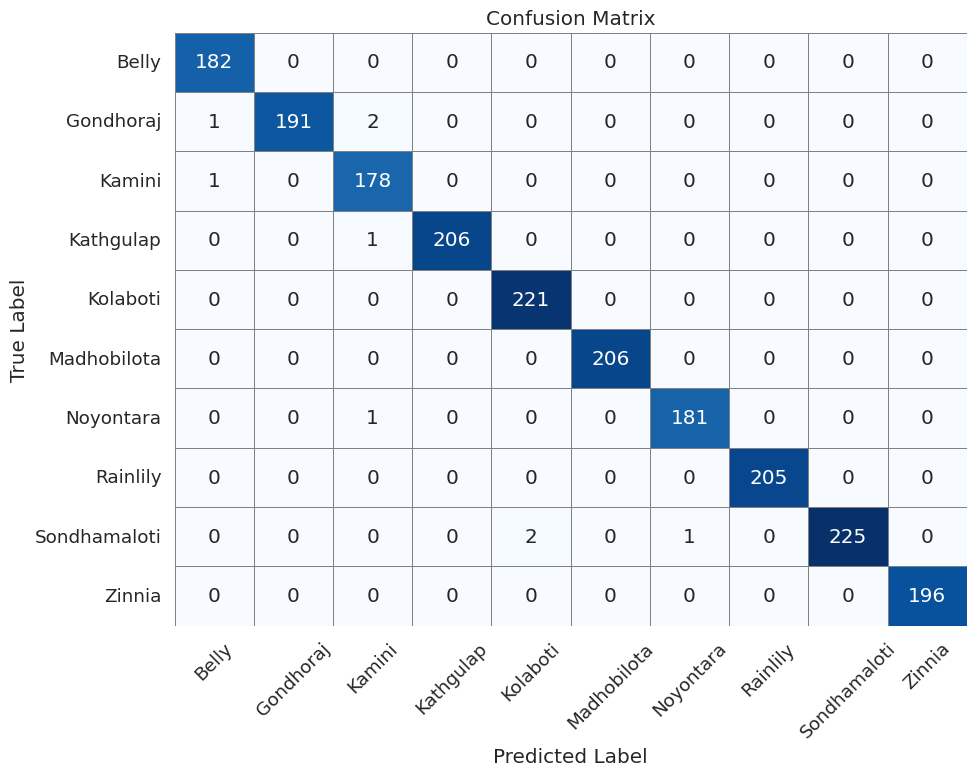

In [59]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Predict on test data
y_pred_prob = model.predict(test_ds, verbose=1)
y_pred = np.argmax(y_pred_prob, axis=1)
y_true = test_ds.classes

# Generate confusion matrix
cm = confusion_matrix(y_true, y_pred)
labels = list(test_ds.class_indices.keys())

# Plot using seaborn with light color palette
plt.figure(figsize=(10, 8))
sns.set(font_scale=1.2)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=labels, yticklabels=labels, cbar=False,
            linewidths=0.5, linecolor='gray')
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


In [60]:
from sklearn.metrics import f1_score
import numpy as np

# Make sure the model is already trained and test_ds is ready
# Predict class probabilities
y_pred_prob = model.predict(test_ds, verbose=1)

# Convert predicted probabilities to class indices
y_pred = np.argmax(y_pred_prob, axis=1)

# Get true class indices
y_true = test_ds.classes

# Compute weighted F1 score
f1 = f1_score(y_true, y_pred, average='weighted')

# Print F1 score with high precision
print(f"Weighted F1 Score: {f1:.10f}")


63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step
Weighted F1 Score: 0.9955039559
